# Models of Neurons part 1


We first consider the equation:
$	C_m \dfrac{d V_m}{d t} = - g_l (V_m - E_l)$

We are going to simulate this equation with the Euler method.

In [1]:
using Plots
gr()
using Statistics

Plots.GRBackend()

In [2]:
function LIFneuron(t,dt,I,V0,spike=false)
  # Numerical simulation of a LIF neuron  
    if spike
        
        N = Int(t/dt)+1
        V = V0.*ones(N)
        
        for i=2:N
            V[i] = V[i-1] + dt*(-gl*(V[i-1] - El))/Cm + dt*I[i]/Cm
            if V[i] > Vth
                V[i] = Vreset
            end
        end
        
    else
            
        N = Int(t/dt)+1
        V = V0.*ones(N)
        
        for i=2:N
            V[i] = V[i-1] + dt*(-gl*(V[i-1] - El))/Cm + dt*I[i]/Cm
        end
    end
    
    return V
end

LIFneuron (generic function with 2 methods)

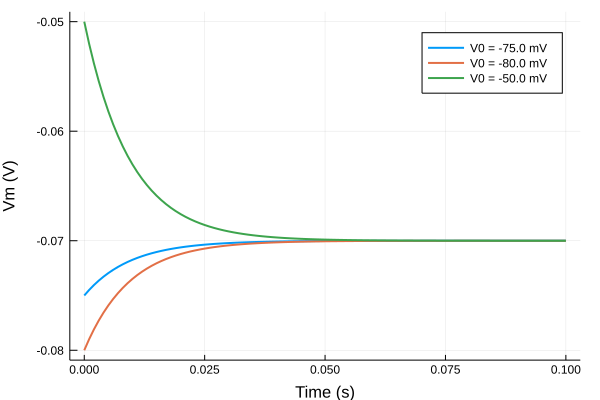

In [3]:
global Cm=100e-12  #F
global gl = 10e-9  #S
global El = -70e-3  #V


dt=1.0e-3 # in ms
t=0.1 # in s
I=zeros(Int(t/dt)+1)

fig = plot()
for V0 in [-75.0,-80.0,-50.0]#in mV
    
    V = LIFneuron(t,dt,I,V0*0.001)
    plot!(fig,0:dt:t,V,linewidth=2,label="V0 = $V0 mV")
end

xlabel!("Time (s)")
ylabel!("Vm (V)")
fig

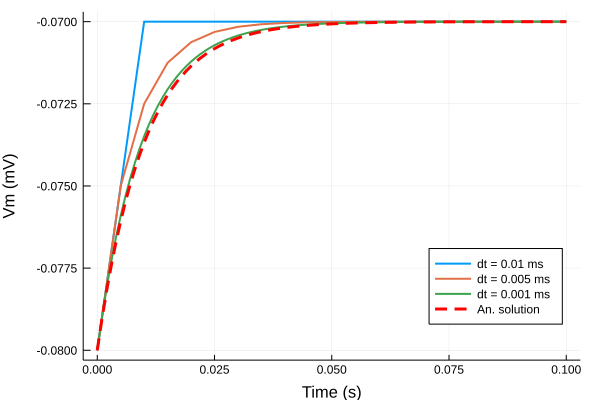

In [4]:
# We are going to look at the influence of dt

t=100e-3 # in s
I=zeros(Int(t/dt)+1)
V0=-80e-3 # in V

fig = plot(legend=:bottomright)

for dt in [10.0e-3,5.0e-3,1.0e-3]
    
    I=zeros(Int(t/dt)+1)
    V = LIFneuron(t,dt,I,V0)
    plot!(fig,0:dt:t,V,linewidth=2,label="dt = $dt ms")
end

sol(x) = El .+ (V0-El).*exp.(-x./(Cm./gl))

plot!(0:0.001:t,sol(0:0.001:t),linestyle=:dash,color=:red,linewidth=3,label="An. solution")
xlabel!("Time (s)")
ylabel!("Vm (mV)")
fig


We now consider the equation of the LIF model, thus with the emission of a spike. 

\begin{align}
	&C_m \dfrac{d V_m}{d t}  =g_L (E_L - V_m) + I_{app}\\
	&\text{if $V_m > V_{th}$ , then $V_m =V_{reset}$}
\end{align}

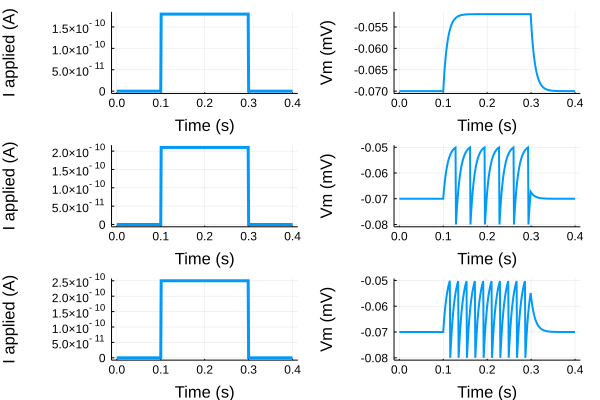

In [5]:
Vth = -50.0e-3 #mV
Vreset = -80.0e-3 #mV
V0=-70.0e-3 # V
# with these conditions taum = 10ms and Ith = 200 pA

dt=1.0e-3
t=400.0e-3
t_plot=LinRange(0.0,t,Int(t/dt)+1)
I = 0.0*ones(Int(t/dt)+1)
t_min =100.0e-3 
t_off=300.0e-3
idx = (t_plot.>t_min) .& (t_plot.<t_off)
I[idx]=0.18e-9.*ones(length(I[idx]))



fig = plot(layout=(3,2),legend=false)
xlabel!("Time (s)")
ylabel!("Vm (mV)")

# low current
V = LIFneuron(t,dt,I,V0,true)
plot!(fig[1], 0:dt:t,I,linewidth=3)
plot!(fig[2],0:dt:t,V,linewidth=2,label="I = 0.18 nA")
ylabel!(fig[1],"I applied (A)")

# medium current
I[idx]=0.21e-9.*ones(length(I[idx]))
V = LIFneuron(t,dt,I,V0,true)
plot!(fig[4],0:dt:t,V,linewidth=2,label="I = 0.21 nA")
plot!(fig[3], 0:dt:t,I,linewidth=3)
ylabel!(fig[3],"I applied (A)")


# High current
I[idx]=0.25e-9.*ones(length(I[idx]))
V = LIFneuron(t,dt,I,V0,true)
plot!(fig[6],0:dt:t,V,linewidth=2,label="I = 0.25 nA")
plot!(fig[5], 0:dt:t,I,linewidth=3)
ylabel!(fig[5],"I applied (A)")

fig

As we can observe the limit current to obtain spikes is the one obtained analytically.

We are now going to focus on the f-I curve of the neuron. We consider a LIF neuron, with the same parameters as previously.

In [6]:
function newLIF(t,dt,I,V0)
  # Numerical simulation of a LIF neuron  
        spike = 0      
        N = Int(t/dt)+1
        V = V0.*ones(N)
        
        for i=2:N
            V[i] = V[i-1] + dt*(-gl*(V[i-1] - El))/Cm + dt*I[i]/Cm
            if V[i] > Vth
                V[i] = Vreset
                spike = spike + 1
            end
        end
    return spike/t, V
end




newLIF (generic function with 1 method)

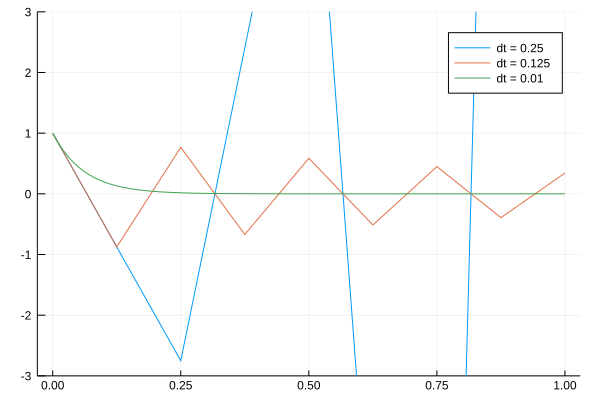

In [17]:
function expEuler(dt,T,y0)
    N = Int(T/dt)+1
    sol  =y0*ones(N)
    for i=2:N
      sol[i]=sol[i-1] -15*dt*sol[i-1]  
    end
    
    
    return sol
end

fig = plot()
for dt in [0.25,0.125,0.01]

    solu = expEuler(dt,1,1.0)

    plot!(0:dt:1.0,solu,label="dt = $dt")
end
ylims!((-3,3))
fig



In [18]:
Vth = -50.0e-3 #mV
Vreset = -80.0e-3 #mV
V0=El # V
# with these conditions taum = 10ms and Ith = 200 pA

dt=0.1e-3
t=5000.0e-3
t_plot=LinRange(0.0,t,Int(t/dt)+1)


Iapp = 0.0:1.0:500.0 # in pA
FRlist = Float64[]

for I0 in Iapp
    
    I = I0.*1.0e-12*ones(Int(t/dt)+1)
    spike,V = newLIF(t,dt,I,V0)
    push!(FRlist,spike)
    
end



In [19]:


taum = 10.0e-3 # in second
Rm = 1/gl

function th_fI(Ilist)
    tlist = Float64[]
    for I in Ilist
    if I*Rm + El - Vth >0.0
        
        t = taum *log(I*Rm + El - Vreset) - taum*log(I*Rm + El - Vth)
            push!(tlist,1/t)  
    else
        
       push!(tlist,0.0) 
    end
        
    end
    return tlist 
end
   


th_fI (generic function with 1 method)

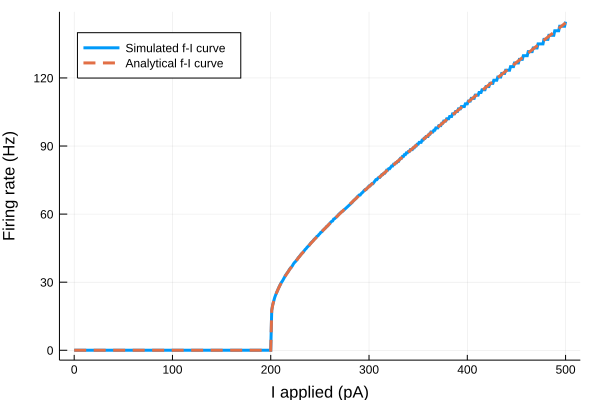

In [20]:
plot(Iapp,FRlist,lw=3,label="Simulated f-I curve")
plot!(legend=:topleft)
xlabel!("I applied (pA)")
ylabel!("Firing rate (Hz)")
plot!(Iapp,th_fI(Iapp.*1.0e-12),lw=3,ls=:dash,label="Analytical f-I curve")

All we have do right now is to compare numerical simulations with rigourous analytical computations. For the last question we are going to study the influence of noise on the system. 

We will first consider noise on the injected current. 

$$ I(t) = I_{app} (t) + \sigma \mu(t)$$
with $\mu(t)$ a white-noise process.

This means that in the discrete version of the differential equation, we now write the following:
$$ I(t) = I_{app} (t) + \dfrac{\sigma N(0,1)}{dt}$$
with $N(0,1)$ meaning that we take a random number following a normal distribution.




In [9]:
using Distributions
n = Normal()

function noisyLIF(t,dt,I,V0,sigma)
  # Numerical simulation of a LIF neuron  
        spike = 0      
        N = Int((t*1e3)/(dt*1e3)+1)
        mu = rand(n,N)
        V = V0.*ones(N)
        
        for i=2:N
            V[i] = V[i-1] + dt*(-gl*(V[i-1] - El))/Cm + dt*I[i]/Cm + sqrt(dt)/Cm*sigma*mu[i]
            if V[i] > Vth
                V[i] = Vreset
                spike = spike + 1
            end
        end
    return spike/t, V
end


using SpecialFunctions

function f(s)
    
    
    return exp(s^2)*(1+erf(s))
end


function intf(mu)
    # in ou case mu = El + Iapp/gl
    value = 0.0
    dx = -((Vreset-mu)/sigma0-(Vth-mu)/sigma0)/1000
  for i =1:1000
        
        value = value + dx*f((Vreset-mu)/sigma0+(i-1)*dx)
    end
    
    return 1/(taum*sqrt(pi)*value)
  
end


intf (generic function with 1 method)

## Noise in the LIF model

In what follow we consider a noisy current. The theory will be studied in TD 4 or TD 5.

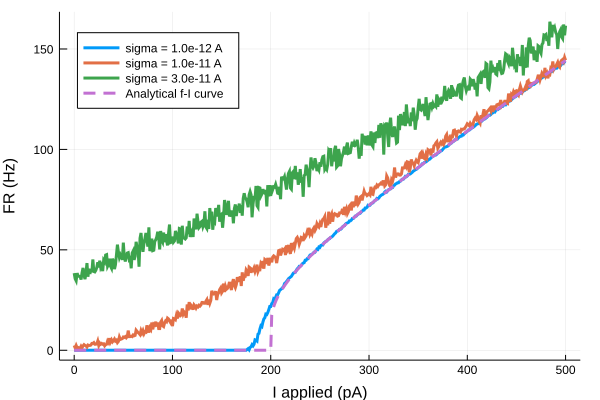

In [10]:
Iapp = 0.0:1.0:500.0 # in pA


fig=plot(legend=:topleft)
for sigma in [1e-12,10e-12,30e-12]
    FRlist = Float64[]

for I0 in Iapp
    
    I = I0.*1.0e-12*ones(Int(t/dt)+1)
    spike,V = noisyLIF(t,dt,I,V0,sigma)
    push!(FRlist,spike)
    
end
plot!(Iapp,FRlist,lw=3,label="sigma = $sigma A")
end
xlabel!("I applied (pA)")
ylabel!("FR (Hz)")
plot!(Iapp,th_fI(Iapp.*1.0e-12),lw=3,ls=:dash,label="Analytical f-I curve")
fig

In [20]:
# Modification of dt 

Iapp = 0.0:1.0:500.0 # in pA
dt = 1.0e-5
t=5000.0e-3
t_plot=LinRange(0.0,t,Int((t*1e3)/(dt*1e3))+1)


500001-element LinRange{Float64}:
 0.0,1.0e-5,2.0e-5,3.0e-5,4.0e-5,5.0e-5,…,4.99996,4.99997,4.99998,4.99999,5.0

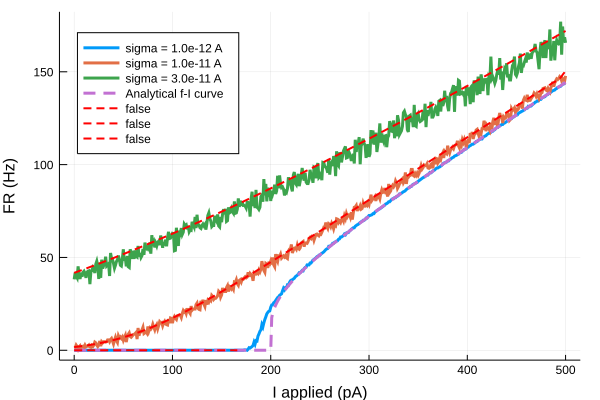

In [21]:

fig=plot(legend=:topleft)
for sigma in [1e-12,10e-12,30e-12]
    FRlist = Float64[]

for I0 in Iapp
    
    I = I0.*1.0e-12*ones(Int((t*1e3)/(dt*1e3))+1)
    spike,V = noisyLIF(t,dt,I,V0,sigma)
    push!(FRlist,spike)
    
end
plot!(Iapp,FRlist,lw=3,label="sigma = $sigma A")
end
xlabel!("I applied (pA)")
ylabel!("FR (Hz)")
plot!(Iapp,th_fI(Iapp.*1.0e-12),lw=3,ls=:dash,label="Analytical f-I curve")



for sigma in [1e-12,10e-12,30e-12]

    sigma0 = sigma/(gl*sqrt(taum))

    rlist=Float64[]
    for I0 in Iapp
        mu0 = El + I0*1e-12/gl

        push!(rlist,intf(mu0))
    end

    plot!(fig,Iapp,rlist,lw=2,color=:red,ls=:dash,label=false)
end


fig


We note thaht the scaling of $dt$ does not impact the result if we took care of $\sqrt{dt}$ in the numerical reoslution. Thus it is important to remember this term.

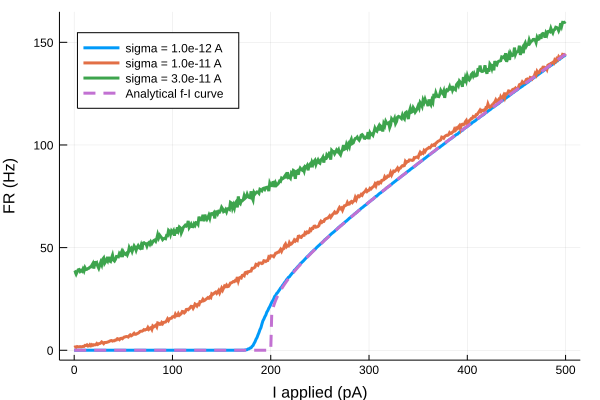

In [264]:
Iapp = 0.0:1.0:500.0 # in pA
dt = 1.0e-4
t=50000.0e-3
t_plot=LinRange(0.0,t,Int((t*1e3)/(dt*1e3))+1)


fig=plot(legend=:topleft)
for sigma in [1e-12,10e-12,30e-12]
    FRlist = Float64[]

for I0 in Iapp
    
    I = I0.*1.0e-12*ones(Int(t/dt)+1)
    spike,V = noisyLIF(t,dt,I,V0,sigma)
    push!(FRlist,spike)
    
end
plot!(Iapp,FRlist,lw=3,label="sigma = $sigma A")
end
xlabel!("I applied (pA)")
ylabel!("FR (Hz)")
plot!(Iapp,th_fI(Iapp.*1.0e-12),lw=3,ls=:dash,label="Analytical f-I curve")
fig